This notebook provides a step-by-step process for cleaning and analyzing a dataset related to sentencing. 
We will explore the data, handle missing and erroneous values, and visualize the cleaned dataset.


In [ ]:
# Create a virtual environment using Anaconda/Miniconda
# conda create -n sentence python=3.10 -y
# conda activate sentence

# Install required packages
# !pip install pandas numpy seaborn matplotlib ydata-profiling
# !pip install -r requirements.txt

In [ ]:
# Dataset can be found at:
# https://datacatalog.cookcountyil.gov/browse?tags=state%27s+attorney+case-level&sortBy=relevance

In [1]:
!conda create -n msds python=3.10.14 -y
!conda activate msds
!pip install --upgrade pycaret

Channels:
 - defaults
Platform: win-64
Solving environment: ...working... done

## Package Plan ##

  environment location: C:\Users\pghat\anaconda3\envs\msds

  added / updated specs:
    - python=3.10.14


The following NEW packages will be INSTALLED:

  bzip2              pkgs/main/win-64::bzip2-1.0.8-h2bbff1b_6 
  ca-certificates    pkgs/main/win-64::ca-certificates-2024.9.24-haa95532_0 
  libffi             pkgs/main/win-64::libffi-3.4.4-hd77b12b_1 
  openssl            pkgs/main/win-64::openssl-3.0.15-h827c3e9_0 
  pip                pkgs/main/win-64::pip-24.2-py310haa95532_0 
  python             pkgs/main/win-64::python-3.10.14-he1021f5_1 
  setuptools         pkgs/main/win-64::setuptools-75.1.0-py310haa95532_0 
  sqlite             pkgs/main/win-64::sqlite-3.45.3-h2bbff1b_0 
  tk                 pkgs/main/win-64::tk-8.6.14-h0416ee5_0 
  tzdata             pkgs/main/noarch::tzdata-2024b-h04d1e81_0 
  vc                 pkgs/main/win-64::vc-14.40-h2eaa2aa_1 
  vs2015_runtime    

In [2]:
!conda info


     active environment : base
    active env location : C:\Users\pghat\anaconda3
            shell level : 1
       user config file : C:\Users\pghat\.condarc
 populated config files : C:\Users\pghat\anaconda3\.condarc
                          C:\Users\pghat\.condarc
          conda version : 24.9.2
    conda-build version : 24.9.0
         python version : 3.12.7.final.0
                 solver : libmamba (default)
       virtual packages : __archspec=1=x86_64_v4
                          __conda=24.9.2=0
                          __win=0=0
       base environment : C:\Users\pghat\anaconda3  (writable)
      conda av data dir : C:\Users\pghat\anaconda3\etc\conda
  conda av metadata url : None
           channel URLs : https://repo.anaconda.com/pkgs/main/win-64
                          https://repo.anaconda.com/pkgs/main/noarch
                          https://repo.anaconda.com/pkgs/r/win-64
                          https://repo.anaconda.com/pkgs/r/noarch
                        

In [3]:
!python -V

Python 3.12.7


In [4]:
!pip install pandas
!pip install numpy

In [5]:
!pip install seaborn

In [6]:
!pip install -r requirements.txt

In [7]:
import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')
warnings.filterwarnings('ignore', category=DeprecationWarning)
warnings.filterwarnings('ignore', category=FutureWarning)

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from ydata_profiling import ProfileReport

# Configure matplotlib to display plots inline
%matplotlib inline

# Set style for better-looking visualizations
# plt.style.use('seaborn')
sns.set_palette('deep')

Data Loading and Initial Inspection -- We'll load the sentencing dataset and perform initial exploratory data analysis (EDA).

In [8]:
# Load the dataset
df = pd.read_csv('data\Sentencing_20241024.csv')

# Display basic information about the dataset
print("Dataset Shape:", df.shape)
print("\nFirst few rows:")
display(df.head())

# Display data types and non-null counts
print("\nDataset Info:")
df.info()

Dataset Shape: (303963, 41)

First few rows:


,CASE_ID,CASE_PARTICIPANT_ID,RECEIVED_DATE,OFFENSE_CATEGORY,PRIMARY_CHARGE_FLAG,CHARGE_ID,CHARGE_VERSION_ID,DISPOSITION_CHARGED_OFFENSE_TITLE,CHARGE_COUNT,DISPOSITION_DATE,...,INCIDENT_CITY,INCIDENT_BEGIN_DATE,INCIDENT_END_DATE,LAW_ENFORCEMENT_AGENCY,LAW_ENFORCEMENT_UNIT,ARREST_DATE,FELONY_REVIEW_DATE,FELONY_REVIEW_RESULT,ARRAIGNMENT_DATE,UPDATED_OFFENSE_CATEGORY
0,149352426337,414373090914,08/15/1984 12:00:00 AM,PROMIS Conversion,False,172131285875,3947642866152,FIRST DEGREE MURDER,2,12/17/2014 12:00:00 AM,...,NaN,08/09/1984 12:00:00 AM,NaN,CHICAGO POLICE DEPT,NaN,08/15/1984 12:00:00 AM,08/15/1984 12:00:00 AM,Charge(S) Approved,09/21/1984 12:00:00 AM,PROMIS Conversion
1,149352426337,414373090914,08/15/1984 12:00:00 AM,PROMIS Conversion,False,172131628541,3335351440787,HOME INVASION,14,12/17/2014 12:00:00 AM,...,NaN,08/09/1984 12:00:00 AM,NaN,CHICAGO POLICE DEPT,NaN,08/15/1984 12:00:00 AM,08/15/1984 12:00:00 AM,Charge(S) Approved,09/21/1984 12:00:00 AM,PROMIS Conversion
2,149352426337,414373090914,08/15/1984 12:00:00 AM,PROMIS Conversion,False,172152873796,4479475438785,FIRST DEGREE MURDER,4,12/17/2014 12:00:00 AM,...,NaN,08/09/1984 12:00:00 AM,NaN,CHICAGO POLICE DEPT,NaN,08/15/1984 12:00:00 AM,08/15/1984 12:00:00 AM,Charge(S) Approved,09/21/1984 12:00:00 AM,PROMIS Conversion
3,149352426337,414373090914,08/15/1984 12:00:00 AM,PROMIS Conversion,False,172153045129,4479253474581,FIRST DEGREE MURDER,5,12/17/2014 12:00:00 AM,...,NaN,08/09/1984 12:00:00 AM,NaN,CHICAGO POLICE DEPT,NaN,08/15/1984 12:00:00 AM,08/15/1984 12:00:00 AM,Charge(S) Approved,09/21/1984 12:00:00 AM,PROMIS Conversion
4,149352426337,414373090914,08/15/1984 12:00:00 AM,PROMIS Conversion,False,172153559127,3328378593890,HOME INVASION,13,12/17/2014 12:00:00 AM,...,NaN,08/09/1984 12:00:00 AM,NaN,CHICAGO POLICE DEPT,NaN,08/15/1984 12:00:00 AM,08/15/1984 12:00:00 AM,Charge(S) Approved,09/21/1984 12:00:00 AM,PROMIS Conversion



Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303963 entries, 0 to 303962
Data columns (total 41 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   CASE_ID                            303963 non-null  int64  
 1   CASE_PARTICIPANT_ID                303963 non-null  int64  
 2   RECEIVED_DATE                      303963 non-null  object 
 3   OFFENSE_CATEGORY                   303963 non-null  object 
 4   PRIMARY_CHARGE_FLAG                303963 non-null  bool   
 5   CHARGE_ID                          303963 non-null  int64  
 6   CHARGE_VERSION_ID                  303963 non-null  int64  
 7   DISPOSITION_CHARGED_OFFENSE_TITLE  303963 non-null  object 
 8   CHARGE_COUNT                       303963 non-null  int64  
 9   DISPOSITION_DATE                   303963 non-null  object 
 10  DISPOSITION_CHARGED_CHAPTER        303963 non-null  object 
 11  DISPOSITION_CHARGED_ACT 

#### Data Inspection and Data Cleaning

In [9]:
# Checking for missing values
df.isnull().sum()

# which values are in the unit column
df['COMMITMENT_UNIT'].value_counts()

COMMITMENT_UNIT
Year(s)         219237
Months           68123
Days             11348
Term              2374
Natural Life       841
Dollars             94
Hours               47
Weeks               24
Pounds               5
Grams                2
Ounces               1
Kilos                1
Name: count, dtype: int64

In [10]:
# Create a copy of data with only 'Year(s)' sentences
years_df = df[df['COMMITMENT_UNIT'] == 'Year(s)'].copy()

# Convert commitment terms to numeric values
years_df['COMMITMENT_TERM'] = pd.to_numeric(years_df['COMMITMENT_TERM'], errors='coerce')

# Display summary statistics of commitment terms
print("Summary Statistics for Commitment Terms (Years):")
print(years_df['COMMITMENT_TERM'].describe())

Summary Statistics for Commitment Terms (Years):
count    2.192340e+05
mean     5.544476e+01
std      1.640220e+04
min      0.000000e+00
25%      2.000000e+00
50%      2.000000e+00
75%      4.000000e+00
max      7.122023e+06
Name: COMMITMENT_TERM, dtype: float64


Select Relevant Columns: We'll choose the most important columns for our analysis.

In [11]:
# Define columns to keep
important_columns = [
    # Temporal information
    'RECEIVED_DATE', 'DISPOSITION_DATE', 'SENTENCE_DATE',
    
    # Case details
    'OFFENSE_CATEGORY', 'DISPOSITION_CHARGED_OFFENSE_TITLE',
    'CHARGE_COUNT', 'CHARGE_DISPOSITION',
    
    # Sentencing information
    'SENTENCE_JUDGE', 'SENTENCE_COURT_NAME',
    'SENTENCE_TYPE', 'COMMITMENT_TYPE', 'COMMITMENT_TERM',
    
    # Demographics
    'AGE_AT_INCIDENT', 'RACE', 'GENDER',
    
    # Location
    'INCIDENT_CITY', 'LAW_ENFORCEMENT_AGENCY'
]

# Create filtered dataset
df_filtered = df[important_columns].copy()

Handle Dates: Convert date strings to datetime objects for better analysis.

In [12]:
# Convert date columns to datetime
date_columns = ['RECEIVED_DATE', 'DISPOSITION_DATE', 'SENTENCE_DATE']

for col in date_columns:
    df_filtered[col] = pd.to_datetime(df_filtered[col], errors='coerce')
    
# Add year column for easier analysis
df_filtered['SENTENCE_YEAR'] = df_filtered['SENTENCE_DATE'].dt.year

# Filter to recent years (2010-2023)
df_filtered = df_filtered[
    (df_filtered['SENTENCE_YEAR'] >= 2010) & 
    (df_filtered['SENTENCE_YEAR'] <= 2023)
]

In [13]:
# Ensure columns are numeric
df_filtered['COMMITMENT_TERM'] = pd.to_numeric(df_filtered['COMMITMENT_TERM'], errors='coerce')
df_filtered['AGE_AT_INCIDENT'] = pd.to_numeric(df_filtered['AGE_AT_INCIDENT'], errors='coerce')

# Calculate summary statistics by race
summary_stats = df_filtered.groupby('RACE').agg({
    'COMMITMENT_TERM': ['mean', 'median', 'std', 'count'],
    'AGE_AT_INCIDENT': ['mean', 'median', 'std']
}).round(2)

print("Summary Statistics by Race:")
display(summary_stats)

Summary Statistics by Race:


COMMITMENT_TERM                           \
                                            mean median       std   count   
RACE                                                                        
ASIAN                                      10.95    8.0     12.25      66   
American Indian                            14.25    4.0     36.29     134   
Asian                                      14.79    3.0     40.64    1762   
Biracial                                   10.24    3.0     18.37      37   
Black                                      69.59    3.0  17417.22  194426   
HISPANIC                                   13.74    6.0     22.64    6111   
Middle Eastern/North African                5.14    2.0      8.34       7   
Unknown                                    11.86    3.0     29.23     453   
White                                      13.00    3.0     32.56   39753   
White [Hispanic or Latino]                 11.96    3.0     32.96   45553   
White/Black [Hispanic or Latino]           12.85    3.0     36.50    1628   

                                 AGE_AT_INCIDENT                
                                            mean median    std  
RACE                                                            
ASIAN                                      32.61   31.0  10.74  
American Indian                            33.60   30.0  10.38  
Asian                                      34.29   32.0  11.59  
Biracial                                   28.51   26.0  10.33  
Black                                      32.11   29.0  11.96  
HISPANIC                                   32.25   31.0   9.94  
Middle Eastern/North African               29.43   26.0   8.52  
Unknown                                    33.34   30.5  11.66  
White                                      34.77   33.0  11.80  
White [Hispanic or Latino]                 31.26   29.0  10.47  
White/Black [Hispanic or Latino]           31.39   29.0  10.93

Clean Categorical Variables: Standardize race categories and other categorical variables.

In [14]:
# Standardize race categories
race_mapping = {
    'ASIAN': 'Asian',
    'White [Hispanic or Latino]': 'Hispanic',
    'HISPANIC': 'Hispanic',
    'WHITE': 'White',
    'BLACK': 'Black'
}

df_filtered['RACE'] = df_filtered['RACE'].replace(race_mapping)

# Remove ambiguous categories
df_filtered = df_filtered[df_filtered['RACE'] != 'White/Black [Hispanic or Latino]']

# Display race distribution
print("Race Distribution:")
print(df_filtered['RACE'].value_counts(normalize=True).round(3))

Race Distribution:
RACE
Black                           0.674
Hispanic                        0.179
White                           0.138
Asian                           0.006
Unknown                         0.002
American Indian                 0.000
Biracial                        0.000
Middle Eastern/North African    0.000
Name: proportion, dtype: float64


In [17]:
# Define a regex pattern to match any string containing spaces, letters, commas, or backticks
pattern = '[\sA-Za-z,`]+'

# Use the regex pattern to filter rows in the 'SENTENCE_DATE' column that contain the specified pattern
# The 'na=False' parameter ensures that NaN values are not included in the filtering
df_filtered.loc[df['SENTENCE_DATE'].str.contains(pattern, na=False), ['SENTENCE_DATE']]

,SENTENCE_DATE
4,2014-10-16
6,2014-10-16
9,2014-10-16
12,2014-08-06
14,2014-08-06
...,...
301623,2023-12-07
301649,2023-12-15
301843,2023-12-19
303614,2021-08-06


In [16]:
df_filtered['SENTENCE_DATE'].dt.year.value_counts() 

SENTENCE_DATE
2014    31135
2013    30840
2012    30338
2015    27541
2011    27177
2016    25984
2017    23747
2018    20593
2019    19087
2022    16233
2023    15791
2021    14618
2020     8119
2010      385
Name: count, dtype: int64

In [18]:
df_filtered.loc[(df_filtered['SENTENCE_DATE'].dt.year >= 2010.0) & (df_filtered['SENTENCE_DATE'].dt.year <= 2023.0)]


,RECEIVED_DATE,DISPOSITION_DATE,SENTENCE_DATE,OFFENSE_CATEGORY,DISPOSITION_CHARGED_OFFENSE_TITLE,CHARGE_COUNT,CHARGE_DISPOSITION,SENTENCE_JUDGE,SENTENCE_COURT_NAME,SENTENCE_TYPE,COMMITMENT_TYPE,COMMITMENT_TERM,AGE_AT_INCIDENT,RACE,GENDER,INCIDENT_CITY,LAW_ENFORCEMENT_AGENCY,SENTENCE_YEAR
4,1984-08-15,2014-12-17,2014-10-16,PROMIS Conversion,HOME INVASION,13,Plea Of Guilty,Clayton Jay Crane,District 6 - Markham,Prison,Illinois Department of Corrections,30.0,27.0,Black,Male,NaN,CHICAGO POLICE DEPT,2014.0
6,1984-08-15,2014-12-17,2014-10-16,PROMIS Conversion,ARMED ROBBERY,15,Plea Of Guilty,Clayton Jay Crane,District 6 - Markham,Prison,Illinois Department of Corrections,30.0,27.0,Black,Male,NaN,CHICAGO POLICE DEPT,2014.0
9,1984-08-15,2014-12-17,2014-10-16,PROMIS Conversion,FIRST DEGREE MURDER,1,Plea Of Guilty,Clayton Jay Crane,District 6 - Markham,Prison,Illinois Department of Corrections,62.0,27.0,Black,Male,NaN,CHICAGO POLICE DEPT,2014.0
12,1984-08-23,2014-08-06,2014-08-06,PROMIS Conversion,ATTEMPT ARMED ROBBERY=720-5\8-4(18-2(A)),3,Verdict Guilty,Thomas V Gainer,District 1 - Chicago,Prison,Illinois Department of Corrections,15.0,30.0,Black,Male,NaN,CHICAGO POLICE DEPT,2014.0
14,1984-08-23,2014-08-06,2014-08-06,PROMIS Conversion,ATT(MURDER)=720-5\8-4(9-1(A)(1-3)),6,Verdict Guilty,Thomas V Gainer,District 1 - Chicago,Prison,Illinois Department of Corrections,30.0,30.0,Black,Male,NaN,CHICAGO POLICE DEPT,2014.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
301623,2023-11-16,2023-12-07,2023-12-07,Narcotics,DOMESTIC BATTERY/BODILY HARM,2,Plea Of Guilty,URSULA WALOWSKI,District 1 - Chicago,Jail,Cook County Department of Corrections,42.0,43.0,Hispanic,Male,Chicago,CHICAGO PD,2023.0
301649,2023-11-17,2023-12-15,2023-12-15,Violation Order Of Protection,POSSESSION OF A CONTROLLED SUBSTANCE,1,Plea Of Guilty,Joseph Cataldo,District 3 - Rolling Meadows,Probation,Probation,24.0,56.0,White,Male,Hoffman Estates,HOFFMAN ESTATES PD,2023.0
301843,2023-11-29,2023-12-19,2023-12-19,Aggravated Battery Police Officer,RESIST/PC OFF/CORR/FRFTR/INJ,1,Plea Of Guilty,Domenica A Stephenson,District 1 - Chicago,Probation,Probation,24.0,24.0,Black,Female,Chicago,COOK COUNTY DEPT. OF CORRECTIONS,2023.0
303614,2024-05-01,2024-08-14,2021-08-06,Forgery,FORGERY,3,Plea Of Guilty,Arthur Wesley Willis,District 1 - Chicago,2nd Chance Probation,Probation,24.0,58.0,Unknown,Female,Chicago,COOK COUNTY STATE'S ATTORNEY'S OFFICE,2021.0


In [19]:
df_filtered['SENTENCE_year']=df_filtered['SENTENCE_DATE'].dt.year
print(df_filtered['SENTENCE_year'])

4         2014
6         2014
9         2014
12        2014
14        2014
          ... 
301623    2023
301649    2023
301843    2023
303614    2021
303615    2021
Name: SENTENCE_year, Length: 291588, dtype: int32


In [20]:
# df_filtered.groupby('RACE')['SENTENCE_year'].median()
df_filtered['RACE'].value_counts()

RACE
Black                           195542
Hispanic                         51916
White                            40129
Asian                             1852
Unknown                            453
American Indian                    136
Biracial                            37
Middle Eastern/North African         7
Name: count, dtype: int64

In [21]:
#collapse race categories
df_filtered['RACE'].replace("ASIAN", "Asian", inplace = True)
df_filtered['RACE'].replace("White [Hispanic or Latino]", "Hispanic", inplace = True)
df_filtered['RACE'].replace("HISPANIC", "Hispanic", inplace = True)

keep_df = df_filtered[df_filtered['RACE'] != "White/Black [Hispanic or Latino]"]
keep_df['RACE'].value_counts()

RACE
Black                           195542
Hispanic                         51916
White                            40129
Asian                             1852
Unknown                            453
American Indian                    136
Biracial                            37
Middle Eastern/North African         7
Name: count, dtype: int64

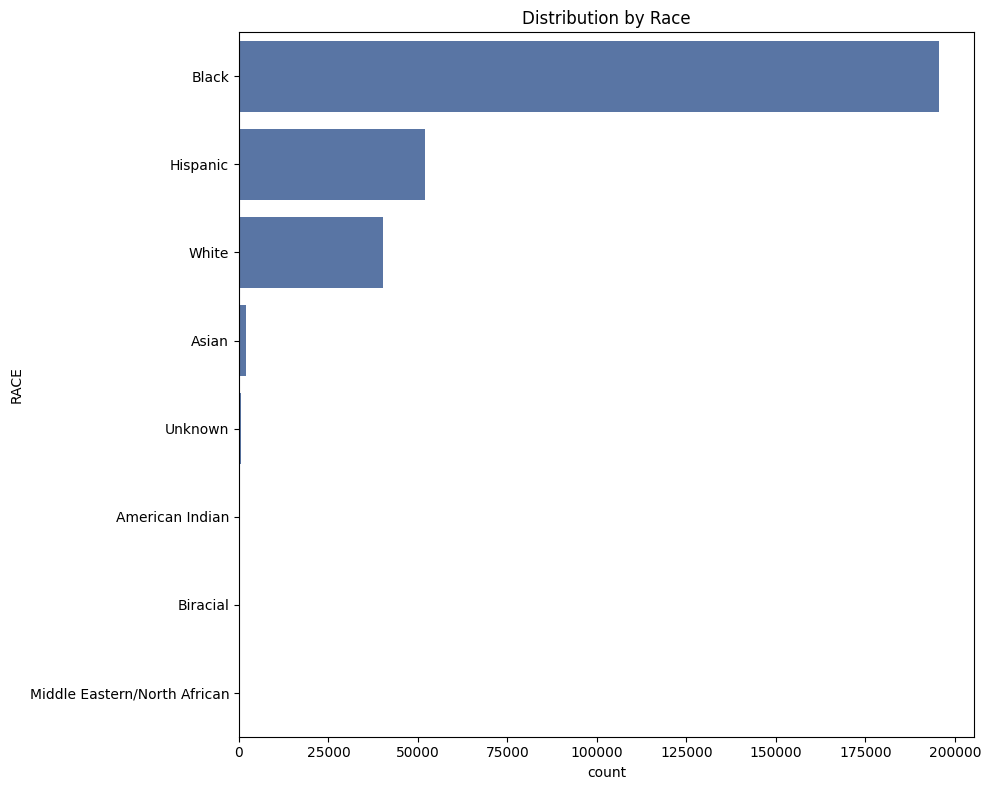

In [22]:
# Race Distribution
plt.figure(figsize=(10, 8)) 
sns.countplot(data=df_filtered, y='RACE', 
               order=df_filtered['RACE'].value_counts().index)
plt.title('Distribution by Race')
plt.tight_layout()
plt.show()

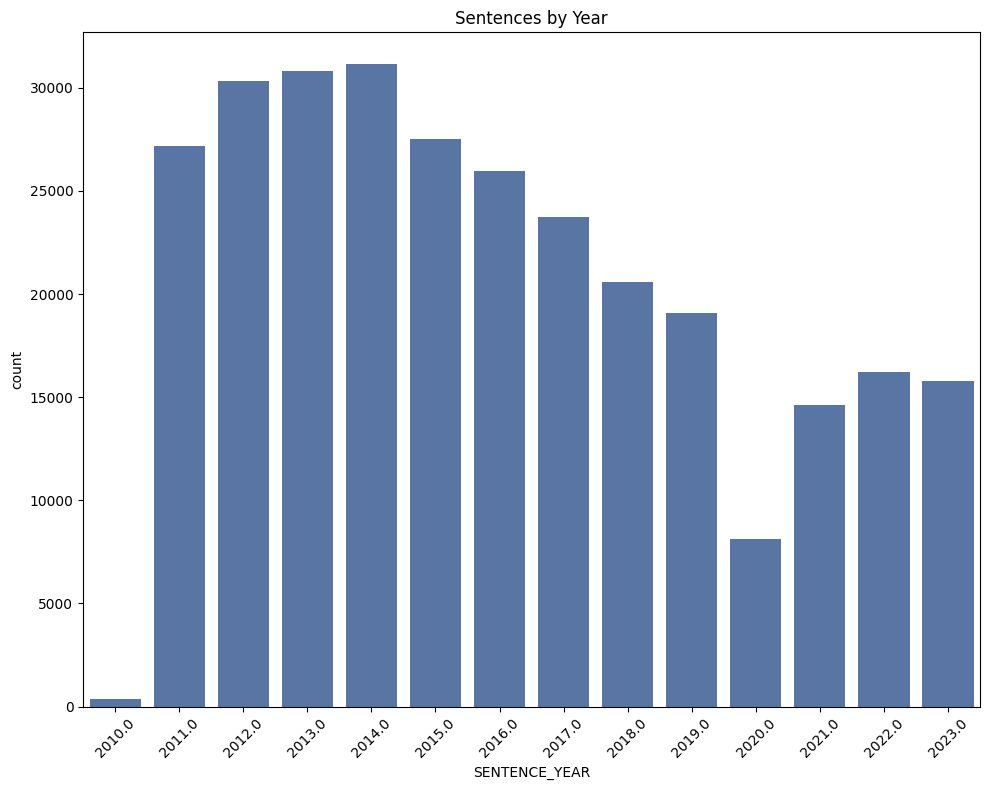

In [23]:
# Sentences by Year
plt.figure(figsize=(10, 8)) 
sns.countplot(data=df_filtered, x='SENTENCE_YEAR')
plt.xticks(rotation=45)
plt.title('Sentences by Year')
plt.tight_layout()
plt.show() 

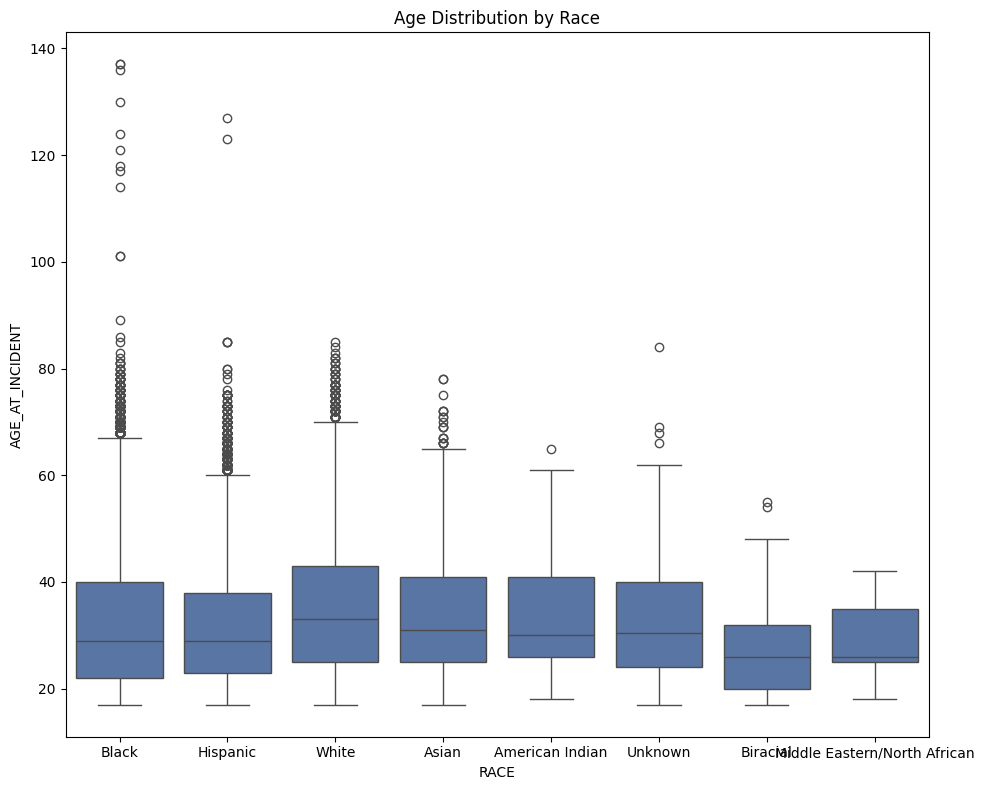

In [24]:
# Age Distribution by Race
plt.figure(figsize=(10, 8)) 
sns.boxplot(data=df_filtered, x='RACE', y='AGE_AT_INCIDENT')
plt.title('Age Distribution by Race')
plt.tight_layout()
plt.show()

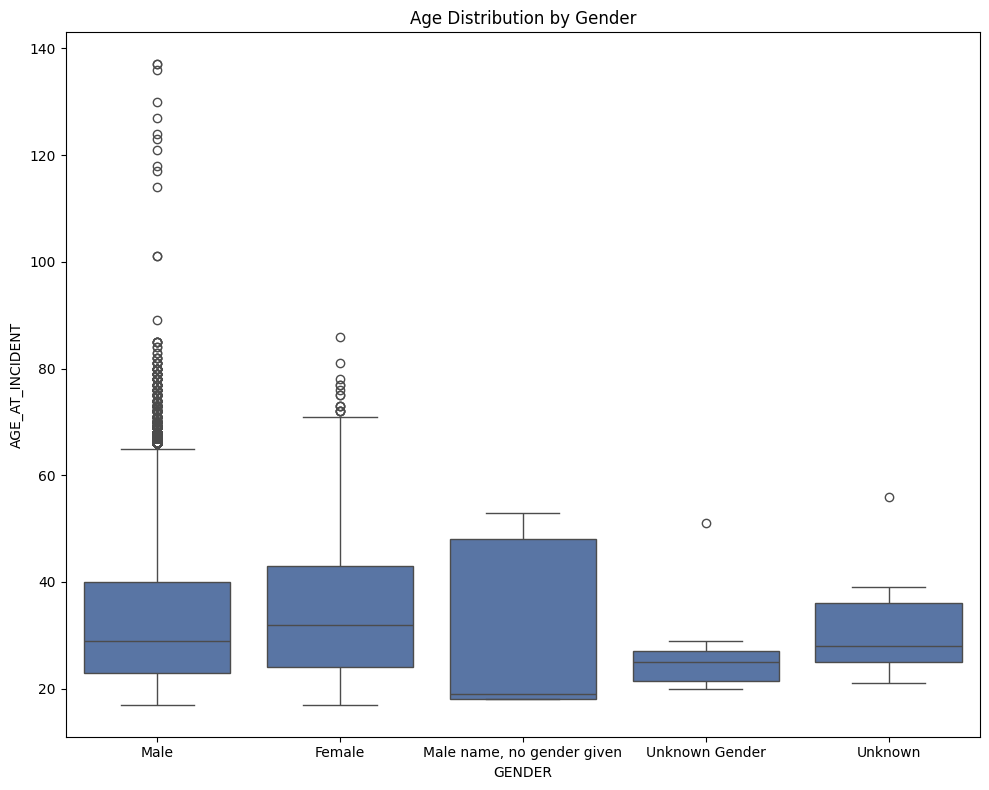

In [25]:
# Age Distribution by Gender
plt.figure(figsize=(10, 8)) 
sns.boxplot(data=df_filtered, x='GENDER', y='AGE_AT_INCIDENT')
plt.title('Age Distribution by Gender')
plt.tight_layout()

In [ ]:
# It will take 7 minutes to run the this code to generate the profiling report
# Generate the report
# profile = ProfileReport(df, title="Sentencing Data Profile", explorative=True)
# profile.to_file("ydata_profiling_report.html")

In [38]:
!pip install ydata-profiling

# Import pandas.
# Import the ProfileReport class from the ydata_profiling library.
# Create a DataFrame using your data.
# Use the ProfileReport() class and pass the DataFrame.

In [39]:
import ydata_profiling as yp

In [40]:
import pandas as pd
from ydata_profiling import ProfileReport

df = pd.read_csv('data\Sentencing_20241024.csv')
profile = ProfileReport(df, title="Profiling Report")

Here's the straightforward code following the steps outlined above. First, we import the necessary libraries and then read the CSV file using the read_csv() function. In this case, we're using the CSV file of Setencing Reviews. Next, we use the ProfileReport class and pass our DataFrame inside it.

Additionally, we're setting a new title, "ProfileReport". By default, the title is something else, but if you want to customize it, use the title variable within the class. Finally, to generate and display the report, you can either use profile or profile.to_notebook_iframe().


The report will be generated in the following sequence: First, the entire dataset will be summarized. Then, the report structure will be generated. Finally, it will display the report, which you can save as an HTML file and use for further analysis.

In [42]:
from ydata_profiling import ProfileReport
import pandas as pd
df = pd.read_csv('data\Sentencing_20241024.csv')
profile = ProfileReport(df,title="Sentencing_20241024")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]